# Trabalho Pratico de Aprendizado de Máquina 1


nomes...

## Importações

In [ ]:
import pandas as pd
import plotly.express as px
import seaborn as sns
import numpy as np


## Varíaveis de ambiente

In [ ]:
pd.set_option('display.max_rows', 200) # mostrar no máximo 200 linhas quando imprimir uma variável

## Base de dados

As análises realizadas pelo grupo são sobre o conjunto de dados https://www.kaggle.com/datasets/maharshipandya/-spotify-tracks-dataset



In [ ]:
#https://drive.google.com/file/d/19DiK7wDbeY20nSYoSBqzX8lcZVcSDrCI/view?usp=sharing
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=19DiK7wDbeY20nSYoSBqzX8lcZVcSDrCI' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=19DiK7wDbeY20nSYoSBqzX8lcZVcSDrCI" -O t1_spotifyds.csv && rm -rf /tmp/cookies.txt

--2023-08-17 23:34:29--  https://docs.google.com/uc?export=download&confirm=&id=19DiK7wDbeY20nSYoSBqzX8lcZVcSDrCI
Resolving docs.google.com (docs.google.com)... 142.250.97.139, 142.250.97.102, 142.250.97.113, ...
Connecting to docs.google.com (docs.google.com)|142.250.97.139|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-08-88-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/epde4r6m0gpbqkad99tkjhecrgmj7ffp/1692315225000/09629754278610253155/*/19DiK7wDbeY20nSYoSBqzX8lcZVcSDrCI?e=download&uuid=1ada4ed2-2426-4913-8425-b0e9abf93c26 [following]
--2023-08-17 23:34:33--  https://doc-08-88-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/epde4r6m0gpbqkad99tkjhecrgmj7ffp/1692315225000/09629754278610253155/*/19DiK7wDbeY20nSYoSBqzX8lcZVcSDrCI?e=download&uuid=1ada4ed2-2426-4913-8425-b0e9abf93c26
Resolving doc-08-88-docs.googleusercontent.com (doc-08-88-docs.googleusercontent.com)... 74.125.31.132, 26

In [ ]:
spf = pd.read_csv('t1_spotifyds.csv', index_col = 0)

In [ ]:
spf.head(10)

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.7150,87.917,4,acoustic
1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.2670,77.489,4,acoustic
2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.1200,76.332,4,acoustic
3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.1430,181.740,3,acoustic
4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.1670,119.949,4,acoustic
5,01MVOl9KtVTNfFiBU9I7dc,Tyrone Wells,Days I Will Remember,Days I Will Remember,58,214240,False,0.688,0.4810,6,-8.807,1,0.1050,0.2890,0.000000,0.1890,0.6660,98.017,4,acoustic
6,6Vc5wAMmXdKIAM7WUoEb7N,A Great Big World;Christina Aguilera,Is There Anybody Out There?,Say Something,74,229400,False,0.407,0.1470,2,-8.822,1,0.0355,0.8570,0.000003,0.0913,0.0765,141.284,3,acoustic
7,1EzrEOXmMH3G43AXT1y7pA,Jason Mraz,We Sing. We Dance. We Steal Things.,I'm Yours,80,242946,False,0.703,0.4440,11,-9.331,1,0.0417,0.5590,0.000000,0.0973,0.7120,150.960,4,acoustic
8,0IktbUcnAGrvD03AWnz3Q8,Jason Mraz;Colbie Caillat,We Sing. We Dance. We Steal Things.,Lucky,74,189613,False,0.625,0.4140,0,-8.700,1,0.0369,0.2940,0.000000,0.1510,0.6690,130.088,4,acoustic
9,7k9GuJYLp2AzqokyEdwEw2,Ross Copperman,Hunger,Hunger,56,205594,False,0.442,0.6320,1,-6.770,1,0.0295,0.4260,0.004190,0.0735,0.1960,78.899,4,acoustic


## Análise exploratória Inicial

Verificando todas as informações do dataset. Verifica-se que o conjunto possui 11.400 observações.

In [ ]:
spf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 114000 entries, 0 to 113999
Data columns (total 20 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   track_id          114000 non-null  object 
 1   artists           113999 non-null  object 
 2   album_name        113999 non-null  object 
 3   track_name        113999 non-null  object 
 4   popularity        114000 non-null  int64  
 5   duration_ms       114000 non-null  int64  
 6   explicit          114000 non-null  bool   
 7   danceability      114000 non-null  float64
 8   energy            114000 non-null  float64
 9   key               114000 non-null  int64  
 10  loudness          114000 non-null  float64
 11  mode              114000 non-null  int64  
 12  speechiness       114000 non-null  float64
 13  acousticness      114000 non-null  float64
 14  instrumentalness  114000 non-null  float64
 15  liveness          114000 non-null  float64
 16  valence           11

Todas as colunas contém a mesma quantidade de observações que as linhas totais do dataset, com exceção de 'artists', 'album_name', 'track_name'. Abaixo, confirmamos este fato.  

In [ ]:
spf.isnull().sum()

track_id            0
artists             1
album_name          1
track_name          1
popularity          0
duration_ms         0
explicit            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
time_signature      0
track_genre         0
dtype: int64

In [ ]:
spf_corr = spf.corr().round(3)


<ipython-input-8-ff3cd8b6a280>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  spf_corr = spf.corr().round(3)


In [ ]:
fig = px.imshow(spf_corr,text_auto=True,color_continuous_scale  = 'greens')
fig.update_layout(
    title=dict(
        text = 'Matriz de Correlação - Gêneros do Spotify',
        x = 0.5,
        font = dict(
            family = 'Arial Black',
            size = 25,
            color = 'Black'
        )
    ),
    font=dict(
        family="Arial",
        size=14,
        color="Black"
    )
)
fig.show()

### Verificação dos gêneros

Abaixo, realiza-se a contagem de quantos gêneros únicos são encontrados no dataset e vezes cada um deles foi observado. É possível saber que existem 1000 observações de cada um dos 114 gêneros.

In [ ]:
generos = {}
generos = spf['track_genre'].value_counts()
spf['track_genre'].value_counts()
len(generos)
generos

acoustic             1000
punk-rock            1000
progressive-house    1000
power-pop            1000
pop                  1000
pop-film             1000
piano                1000
party                1000
pagode               1000
opera                1000
new-age              1000
mpb                  1000
minimal-techno       1000
metalcore            1000
metal                1000
mandopop             1000
malay                1000
latino               1000
latin                1000
kids                 1000
k-pop                1000
jazz                 1000
j-rock               1000
j-pop                1000
j-idol               1000
j-dance              1000
iranian              1000
psych-rock           1000
punk                 1000
afrobeat             1000
r-n-b                1000
turkish              1000
trip-hop             1000
trance               1000
techno               1000
tango                1000
synth-pop            1000
swedish              1000
study       

### Seleção de classes

O dataset é bastante extenso e conta com 114 gêneros. Como gênero será a classe, optou-se pela redução do conjunto de observações, em dois conjuntos de 3 gêneros.


> O primeiro -- Diff_spf -- contendo três gêneros considerados sonoramente diferentes: jazz, rock e classico.

> O segundo -- Sim_spf --  contendo três gêneros considerados sonoramente parecidos: pop, indie-pop e k-pop.

A hipótese levantada pelo grupo é que o algorítmo de classificação terá facilidade em classificar corretamente os gêneros sonoramente diferentes e dificildade com os sonoramente parecidos.





#### Redução do dataset

O dataset também é reduzido

In [ ]:
Diff_spf = spf.loc[spf['track_genre'].isin(['jazz', 'hip-hop', 'classical']),['popularity',	'duration_ms', 'explicit', 	'danceability', 	'energy',	'key',	'loudness', 'mode', 'speechiness',	'acousticness', 'instrumentalness', 'liveness',	'valence',	'tempo',	'time_signature',	'track_genre']]
Simp_spf = spf.loc[spf['track_genre'].isin(['pop', 'indie-pop', 'k-pop']),['popularity',	'duration_ms', 'explicit', 	'danceability', 	'energy',	'key',	'loudness', 'mode', 'speechiness',	'acousticness', 'instrumentalness', 'liveness',	'valence',	'tempo',	'time_signature',	'track_genre']]

### Análise biavariada de 'track_genre'

Como 'track_genre' é a classe a qual queremos classificar, verificaremos os como os diferentes atributos se comportam em relação a esta coluna.

#### Diff_spf

In [ ]:
fig = px.imshow(Diff_spf.corr().round(3),text_auto=True,color_continuous_scale  = 'greens')
fig.update_layout(
    title=dict(
        text = 'Matriz de Correlação - Gêneros do Spotify',
        x = 0.5,
        font = dict(
            family = 'Arial Black',
            size = 25,
            color = 'Black'
        )
    ),
    font=dict(
        family="Arial",
        size=14,
        color="Black"
    )
)
fig.show()

<ipython-input-12-98a2feff0d2f>:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



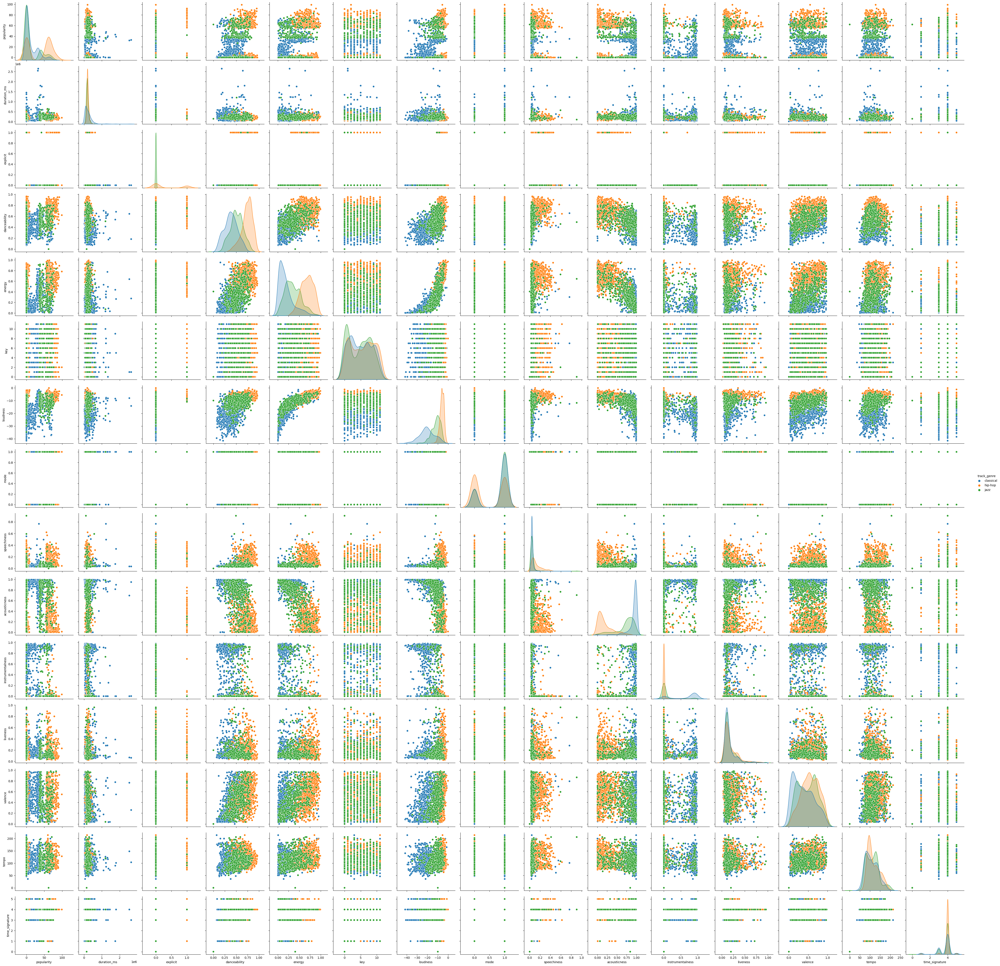

In [ ]:
#sns.pairplot(Diff_spf, hue='track_genre',height=3)

##### **Correlação por gênero**

In [ ]:
jazz_corr = Diff_spf.loc[Diff_spf['track_genre'].isin(['jazz']),:].corr()
rock_corr = Diff_spf.loc[Diff_spf['track_genre'].isin(['hip-hop']),:].corr()
classical_corr = Diff_spf.loc[Diff_spf['track_genre'].isin(['classical']),:].corr()

<ipython-input-14-2367ccd7f5de>:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.

<ipython-input-14-2367ccd7f5de>:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.

<ipython-input-14-2367ccd7f5de>:3: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



In [ ]:
fig = px.imshow(jazz_corr,text_auto=True,color_continuous_scale  = 'greens')
fig.update_layout(
    title=dict(
        text = 'Matriz de Correlação - Jazz',
        x = 0.5,
        font = dict(
            family = 'Arial Black',
            size = 25,
            color = 'Black'
        )
    ),
    font=dict(
        family="Arial",
        size=14,
        color="Black"
    )
)
fig.show()

fig = px.imshow(rock_corr,text_auto=True,color_continuous_scale  = 'greens')
fig.update_layout(
    title=dict(
        text = 'Matriz de Correlação - Hip-Hop',
        x = 0.5,
        font = dict(
            family = 'Arial Black',
            size = 25,
            color = 'Black'
        )
    ),
    font=dict(
        family="Arial",
        size=14,
        color="Black"
    )
)
fig.show()

fig = px.imshow(classical_corr,text_auto=True,color_continuous_scale  = 'greens')
fig.update_layout(
    title=dict(
        text = 'Matriz de Correlação - Classica',
        x = 0.5,
        font = dict(
            family = 'Arial Black',
            size = 25,
            color = 'Black'
        )
    ),
    font=dict(
        family="Arial",
        size=14,
        color="Black"
    )
)
fig.show()

##### **Popularidade por Gênero**


In [ ]:
Diff_popularity = Diff_spf.groupby(['track_genre'], as_index=False)['popularity'].mean()
Diff_popularity.sort_values(by=['popularity'], inplace=True, ascending=False)

In [ ]:
Diff_popularity

,track_genre,popularity
1,hip-hop,37.759
2,jazz,13.628
0,classical,13.055


In [ ]:
fig_popularity = px.histogram(Diff_popularity, x='popularity', y='track_genre', color='track_genre',color_discrete_map={'jazz':'#00A86B', 'hip-hop':'#138808', 'classic':'#ccfe69'}, title="Popularidade Média Por Gênero")
fig_popularity.update_yaxes(title='Gêneros')
fig_popularity.show()

#####**Duração por Gênero**

In [ ]:
Diff_duration = Diff_spf.groupby(['track_genre'], as_index=False)['duration_ms'].mean()
Diff_duration.sort_values(by=['duration_ms'], inplace=True, ascending=False)
Diff_duration['duration_min'] = Diff_duration['duration_ms']/1000/60
Diff_duration

,track_genre,duration_ms,duration_min
0,classical,233075.004,3.884583
1,hip-hop,206680.508,3.444675
2,jazz,190342.200,3.172370


In [ ]:
fig_duration = px.histogram(Diff_duration, x='duration_min', y='track_genre', color='track_genre',color_discrete_map={'jazz':'#00A86B', 'hip-hop':'#138808', 'classic':'#ccfe69'}, title="Duração Média Por Gênero (Min)")
fig_duration.update_yaxes(title='Gêneros')
fig_duration.show()

##### Explicit


In [ ]:
Diff_explicit = Diff_spf.groupby(['track_genre'], as_index=False)['explicit'].sum()
Diff_explicit.sort_values(by=['explicit'], inplace=True, ascending=False)
Diff_explicit

,track_genre,explicit
1,hip-hop,319
2,jazz,3
0,classical,0


In [ ]:
fig_explicit = px.histogram(Diff_explicit, x='explicit', y='track_genre', color='track_genre',color_discrete_map={'jazz':'#00A86B', 'hip-hop':'#138808', 'classic':'#ccfe69'}, title="Quantidade de músicas com letra explícita")
fig_explicit.update_yaxes(title='Gêneros')
fig_explicit.show()

##### **Danceability**


In [ ]:
Diff_danceability = Diff_spf.groupby(['track_genre'], as_index=False)['danceability'].mean()
Diff_danceability.sort_values(by=['danceability'], inplace=True, ascending=False)
Diff_danceability

,track_genre,danceability
1,hip-hop,0.736154
2,jazz,0.509975
0,classical,0.381923


In [ ]:
fig_danceability = px.histogram(Diff_danceability, x='danceability', y='track_genre', color='track_genre',color_discrete_map={'jazz':'#00A86B', 'hip-hop':'#138808', 'classic':'#ccfe69'}, title="Dançabilidade Média por Gênero")
fig_danceability.update_yaxes(title='Gêneros')
fig_danceability.show()

##### **energy**


In [ ]:
Diff_energy = Diff_spf.groupby(['track_genre'], as_index=False)['energy'].mean()
Diff_energy.sort_values(by=['energy'], inplace=True, ascending=False)
Diff_energy

,track_genre,energy
1,hip-hop,0.682530
2,jazz,0.352954
0,classical,0.189827


In [ ]:
fig_energy = px.histogram(Diff_energy, x='energy', y='track_genre', color='track_genre',color_discrete_map={'jazz':'#00A86B', 'hip-hop':'#138808', 'classic':'#ccfe69'}, title="Dançabilidade Média por Gênero")
fig_energy.update_yaxes(title='Gêneros')
fig_energy.show()


##### key


##### loudness


In [ ]:
Diff_loudness = Diff_spf.groupby(['track_genre'], as_index=False)['loudness'].mean()
Diff_loudness.sort_values(by=['loudness'], inplace=True, ascending=False)
Diff_loudness

,track_genre,loudness
1,hip-hop,-5.981619
2,jazz,-11.578765
0,classical,-20.145216


In [ ]:
fig_loudness= px.histogram(Diff_loudness, x='loudness', y='track_genre', color='track_genre',color_discrete_map={'pop':'#00A86B', 'hip-hop':'#138808', 'classic':'#ccfe69'}, title="Dançabilidade Média por Gênero")
fig_loudness.update_yaxes(title='Gêneros')
fig_loudness.show()

##### mode

In [ ]:
Diff_loudness = Diff_spf.groupby(['track_genre'], as_index=False)['loudness'].mean()
Diff_loudness.sort_values(by=['loudness'], inplace=True, ascending=False)
Diff_loudness

,track_genre,loudness
1,hip-hop,-5.981619
2,jazz,-11.578765
0,classical,-20.145216


In [ ]:
fig_energy= px.histogram(Diff_energy, x='energy', y='track_genre', color='track_genre',color_discrete_map={'pop':'#00A86B', 'rock':'#138808', 'classic':'#ccfe69'}, title="Dançabilidade Média por Gênero")
fig_energy.update_yaxes(title='Gêneros')
fig_energy.show()

##### speechiness


##### acousticness


##### instrumentalness


##### valence


##### tempo	time_signature

##### liveness


#### Simp_spf

In [ ]:
#sns.pairplot(Simp_spf, hue='track_genre',size=3)

# Modelos de AM

In [ ]:
from sklearn.naive_bayes import GaussianNB
import sklearn.metrics as skm

In [ ]:
def train_and_test_model(dataset: object, class_column_name: str, classifier: object, proporcao_teste: float) -> list:
    results = []

    sub_data_sets = []
    train_data = []
    test_data = []

    for clss in dataset[class_column_name].unique():
        sub_data_sets.append(dataset[dataset[class_column_name] == clss])

    for subdt in sub_data_sets:
        test_qtd = round(len(subdt.index)*proporcao_teste)

        subdt = subdt.sample(frac= 1)
        train_data.append(subdt.iloc[test_qtd:,:])
        test_data.append(subdt.iloc[:test_qtd,:])

    train_data = pd.concat(train_data).sample(frac= 1)
    test_data = pd.concat(test_data).sample(frac= 1)

    #Divididno em atributos e classe
    class_column = train_data[class_column_name]
    atributes_columns = train_data.drop(columns= class_column_name)

    #Treinando Modelo
    classifier.fit(atributes_columns, class_column)

    #Divididno em atributos e classe
    true_label = test_data[class_column_name]
    atributes_columns = test_data.drop(columns= class_column_name)

    #Tenstando modelo
    predicted_labels = classifier.predict(atributes_columns)

    results = {
        'true': list(true_label),
        'predicted': list(predicted_labels)
    }
    return results

## Naïve Bayes

### Sem mexer nos dados

In [ ]:
classifier = GaussianNB()

In [ ]:
f1s40 = []
f1s35 = []
f1s30 = []
f1s25 = []
f1s20 = []
for i in range(100):
    controle_nb40 = train_and_test_model(Diff_spf, 'track_genre', classifier, 0.4)
    controle_nb35 = train_and_test_model(Diff_spf, 'track_genre', classifier, 0.35)
    controle_nb30 = train_and_test_model(Diff_spf, 'track_genre', classifier, 0.3)
    controle_nb25 = train_and_test_model(Diff_spf, 'track_genre', classifier, 0.25)
    controle_nb20 = train_and_test_model(Diff_spf, 'track_genre', classifier, 0.20)
    f1s40.append(round(skm.f1_score(controle_nb40['true'], controle_nb40['predicted'], average= "macro"),2))
    f1s35.append(round(skm.f1_score(controle_nb35['true'], controle_nb35['predicted'], average= "macro"),2))
    f1s30.append(round(skm.f1_score(controle_nb30['true'], controle_nb30['predicted'], average= "macro"),2))
    f1s25.append(round(skm.f1_score(controle_nb25['true'], controle_nb25['predicted'], average= "macro"),2))
    f1s20.append(round(skm.f1_score(controle_nb20['true'], controle_nb20['predicted'], average= "macro"),2))

print('40%')
print(np.mean(f1s40))
print(np.std(f1s40))
print()

print('35%')
print(np.mean(f1s35))
print(np.std(f1s35))
print()

print('30%')
print(np.mean(f1s30))
print(np.std(f1s30))
print()

print('25%')
print(np.mean(f1s25))
print(np.std(f1s25))

print()
print('20%')
print(np.mean(f1s20))
print(np.std(f1s20))

40%
0.7283
0.01743874995520036

35%
0.7334
0.01710087717048457

30%
0.7325
0.018350749303502584

25%
0.7344999999999999
0.017399712641305333

20%
0.7333
0.018711226576576975


### Com seleção de atributos relevantes

In [ ]:
Diff_spf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3000 entries, 16000 to 64999
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   popularity        3000 non-null   int64  
 1   duration_ms       3000 non-null   int64  
 2   explicit          3000 non-null   bool   
 3   danceability      3000 non-null   float64
 4   energy            3000 non-null   float64
 5   key               3000 non-null   int64  
 6   loudness          3000 non-null   float64
 7   mode              3000 non-null   int64  
 8   speechiness       3000 non-null   float64
 9   acousticness      3000 non-null   float64
 10  instrumentalness  3000 non-null   float64
 11  liveness          3000 non-null   float64
 12  valence           3000 non-null   float64
 13  tempo             3000 non-null   float64
 14  time_signature    3000 non-null   int64  
 15  track_genre       3000 non-null   object 
dtypes: bool(1), float64(9), int64(5), obj

In [ ]:
mantidas = ['explicit', 'danceability', 'energy', 'loudness', 'acousticness', 'instrumentalness', 'track_genre']
removidas = Diff_spf.columns.difference(mantidas)
Diff_spf_reducted = Diff_spf.drop(columns= removidas)

In [ ]:
f1s = []
bestf1 = 0

for i in range(100):
    reducted_nb = train_and_test_model(Diff_spf_reducted, 'track_genre', classifier, 0.25)
    score = skm.f1_score(reducted_nb['true'], reducted_nb['predicted'], average= "macro")
    f1s.append(round(score,2))
    if score > bestf1:
      bestf1 = score
      best = [reducted_nb['true'], reducted_nb['predicted']]


skm.ConfusionMatrixDisplay.from_predictions(best[0], best[1], cmap = 'Oranges')

print(skm.classification_report(best[0], best[1]))

print("Average F1-score")
print(np.mean(f1s))
print("Standard Deviation F1-score")
print(np.std(f1s))


### Seleção de atributos não correlacionados

In [ ]:
removidas = ['energy', 'acousticness', 'instrumentalness']
Diff_spf_reducted = Diff_spf.drop(columns= removidas)

In [ ]:
Sf1s = []
bestf1 = 0
for i in range(100):
    reducted_nc_nb = train_and_test_model(Diff_spf_reducted, 'track_genre', classifier, 0.25)
    score = skm.f1_score(reducted_nc_nb['true'], reducted_nc_nb['predicted'], average= "macro")
    f1s.append(round(score,2))
    if score > bestf1:
      bestf1 = score
      best = [reducted_nc_nb['true'], reducted_nc_nb['predicted']]


skm.ConfusionMatrixDisplay.from_predictions(best[0], best[1], cmap = 'Oranges')

print(skm.classification_report(best[0], best[1]))

print("Average F1-score")
print(np.mean(f1s))
print("Standard Deviation F1-score")
print(np.std(f1s))

### Combinando atributos relacionado com PCA

In [ ]:
 from sklearn.decomposition import PCA

In [ ]:
pca = PCA(n_components= 1)

correlacionadas = ['loudness', 'energy', 'acousticness', 'instrumentalness', 'danceability', 'valence']
Diff_corr = Diff_spf[correlacionadas]
Diff_combined = Diff_spf.drop(columns= correlacionadas)

Diff_combined['combined'] = pca.fit(Diff_corr).transform(Diff_corr)

In [ ]:
f1s = []
bestf1 = 0

for i in range(100):
    combined_pca_nb = train_and_test_model(Diff_combined, 'track_genre', classifier, 0.25)
    score = (skm.f1_score(combined_pca_nb['true'], combined_pca_nb['predicted'], average= "macro"))
    f1s.append(round(score,2))
    if score > bestf1:
      bestf1 = score
      best = [combined_pca_nb['true'], combined_pca_nb['predicted']]
      best_clf = classifier


skm.ConfusionMatrixDisplay.from_predictions(best[0], best[1], cmap = 'Oranges')

print(skm.classification_report(best[0], best[1]))

print("Average F1-score")
print(np.mean(f1s))
print("Standard Deviation F1-score")
print(np.std(f1s))

## Decision Tree

In [ ]:
from sklearn import tree

### Arvore de Decisão com profundidade


In [ ]:
classifier = tree.DecisionTreeClassifier()

In [ ]:
decision_tree = train_and_test_model(Diff_spf, 'track_genre', classifier, 0.25)
skm.f1_score(decision_tree['true'], decision_tree['predicted'], average= "macro")


In [ ]:
f1s40 = []
f1s35 = []
f1s30 = []
f1s25 = []
f1s20 = []
for i in range(100):
    controle_nb40 = train_and_test_model(Diff_spf, 'track_genre', classifier, 0.4)
    controle_nb35 = train_and_test_model(Diff_spf, 'track_genre', classifier, 0.35)
    controle_nb30 = train_and_test_model(Diff_spf, 'track_genre', classifier, 0.3)
    controle_nb25 = train_and_test_model(Diff_spf, 'track_genre', classifier, 0.25)
    controle_nb20 = train_and_test_model(Diff_spf, 'track_genre', classifier, 0.20)
    f1s40.append(round(skm.f1_score(controle_nb40['true'], controle_nb40['predicted'], average= "macro"),2))
    f1s35.append(round(skm.f1_score(controle_nb35['true'], controle_nb35['predicted'], average= "macro"),2))
    f1s30.append(round(skm.f1_score(controle_nb30['true'], controle_nb30['predicted'], average= "macro"),2))
    f1s25.append(round(skm.f1_score(controle_nb25['true'], controle_nb25['predicted'], average= "macro"),2))
    f1s20.append(round(skm.f1_score(controle_nb20['true'], controle_nb20['predicted'], average= "macro"),2))

print('40%')
print(np.mean(f1s40))
print(np.std(f1s40))
print()

print('35%')
print(np.mean(f1s35))
print(np.std(f1s35))
print()

print('30%')
print(np.mean(f1s30))
print(np.std(f1s30))
print()

print('25%')
print(np.mean(f1s25))
print(np.std(f1s25))

print()
print('20%')
print(np.mean(f1s20))
print(np.std(f1s20))

40%
0.8943000000000001
0.010320368210485526

35%
0.8975000000000002
0.010805091392487165

30%
0.8987
0.011632282665066229

25%
0.9020000000000001
0.01232882800593796

20%
0.9003000000000001
0.012037856952132312


              precision    recall  f1-score   support

   classical       0.94      0.94      0.94       200
     hip-hop       0.98      0.96      0.97       200
        jazz       0.90      0.92      0.91       200

    accuracy                           0.94       600
   macro avg       0.94      0.94      0.94       600
weighted avg       0.94      0.94      0.94       600

Average F1-score
0.9016000000000001
Standard Deviation F1-score
0.011723480711802283


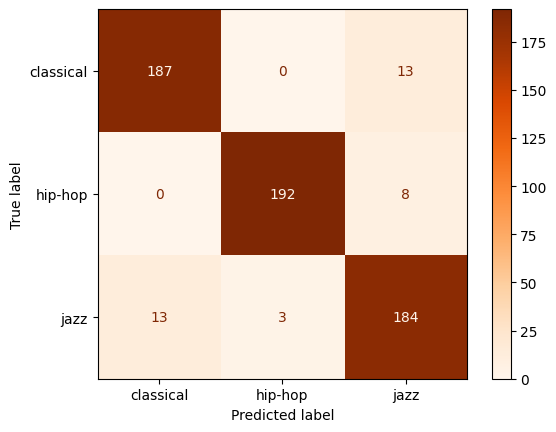

In [ ]:
f1s = []
bestf1 = 0
for i in range(100):
    tree_clf = train_and_test_model(Diff_spf, 'track_genre', classifier, 0.20)
    score = skm.f1_score(tree_clf['true'], tree_clf['predicted'], average= "macro")
    f1s.append(round(score,2))
    if score > bestf1:
      bestf1 = score
      best = [tree_clf['true'], tree_clf['predicted']]
      best_clf = classifier


skm.ConfusionMatrixDisplay.from_predictions(best[0], best[1], cmap = 'Oranges')

print(skm.classification_report(best[0], best[1]))

print("Average F1-score")
print(np.mean(f1s))
print("Standard Deviation F1-score")
print(np.std(f1s))

In [ ]:
#ao reconhecer q arvore de decisao seria uma otima escolhas analizar as rpofundidades e procurar possivel overffiting

In [ ]:
best_mean = 0
mean = 0.1
max_depth = 1
bestsf1 = []

while True:
    classifier = tree.DecisionTreeClassifier(max_depth= max_depth)

    f1s = []
    bestf1 = 0
    for i in range(100):
        tree_clf = train_and_test_model(Diff_spf, 'track_genre', classifier, 0.25)
        score = skm.f1_score(tree_clf['true'], tree_clf['predicted'], average= "macro")
        f1s.append(round(score,2))
        if score > bestf1:
            bestf1 = score
            best = [tree_clf['true'], tree_clf['predicted']]
            best_clf = classifier



    #skm.ConfusionMatrixDisplay.from_predictions(best[0], best[1], cmap = 'Oranges')

    #print(skm.classification_report(best[0], best[1]))

    mean = np.mean(f1s)
    bestsf1.append(mean)

    print("\n Tree com maxdeaph", max_depth)
    print("Average F1-score")
    print(mean)
    print("Standard Deviation F1-score")
    print(np.std(f1s))



    if best_mean < mean:
        best_mean = mean
    else:
        break

    max_depth+=1

In [ ]:
import plotly.express as px

fig = px.line(x=range(1,len(bestsf1)+1), y=bestsf1, title='F1 score por profundidade maxima da árvore', width= 600)
fig.update_layout(
    xaxis_title="Profundidade máxima",
    yaxis_title="F1-Score médio",
    showlegend=False,
    font=dict(
        size=12,
        color="Black"
    )
)
fig.show()

In [ ]:
skm.ConfusionMatrixDisplay.from_predictions(best[0], best[1], cmap = 'Oranges')

print(skm.classification_report(best[0], best[1]))

# Similares

In [ ]:
fig = px.imshow(Simp_spf.corr().round(3),text_auto=True,color_continuous_scale  = 'greens')
fig.update_layout(
    title=dict(
        text = 'Matriz de Correlação - Gêneros do Spotify',
        x = 0.5,
        font = dict(
            family = 'Arial Black',
            size = 25,
            color = 'Black'
        )
    ),
    font=dict(
        family="Arial",
        size=14,
        color="Black"
    )
)
fig.show()

como ja descobrimos as melhores forma de rodar os algoritmos, testaremos as melhores formas na base similar

## Naïve Bayes

In [ ]:
classifier = GaussianNB()

In [ ]:
f1s40 = []
f1s35 = []
f1s30 = []
f1s25 = []
f1s20 = []
for i in range(100):
    controle_nb40 = train_and_test_model(Simp_spf, 'track_genre', classifier, 0.4)
    controle_nb35 = train_and_test_model(Simp_spf, 'track_genre', classifier, 0.35)
    controle_nb30 = train_and_test_model(Simp_spf, 'track_genre', classifier, 0.3)
    controle_nb25 = train_and_test_model(Simp_spf, 'track_genre', classifier, 0.25)
    controle_nb20 = train_and_test_model(Simp_spf, 'track_genre', classifier, 0.20)
    f1s40.append(round(skm.f1_score(controle_nb40['true'], controle_nb40['predicted'], average= "macro"),2))
    f1s35.append(round(skm.f1_score(controle_nb35['true'], controle_nb35['predicted'], average= "macro"),2))
    f1s30.append(round(skm.f1_score(controle_nb30['true'], controle_nb30['predicted'], average= "macro"),2))
    f1s25.append(round(skm.f1_score(controle_nb25['true'], controle_nb25['predicted'], average= "macro"),2))
    f1s20.append(round(skm.f1_score(controle_nb20['true'], controle_nb20['predicted'], average= "macro"),2))

print('40%')
print(np.mean(f1s40))
print(np.std(f1s40))
print()

print('35%')
print(np.mean(f1s35))
print(np.std(f1s35))
print()

print('30%')
print(np.mean(f1s30))
print(np.std(f1s30))
print()

print('25%')
print(np.mean(f1s25))
print(np.std(f1s25))

print()
print('20%')
print(np.mean(f1s20))
print(np.std(f1s20))

40%
0.44900000000000007
0.02692582403567253

35%
0.452
0.02576819745345025

30%
0.44710000000000005
0.021132676120169922

25%
0.44819999999999993
0.025666320343983872

20%
0.44709999999999994
0.025270338343599597


### Combinando atributos relacionado com PCA

In [ ]:
pca = PCA(n_components= 1)

correlacionadas = ['loudness', 'energy', 'acousticness', 'valence']
Simp_corr = Simp_spf[correlacionadas]
Simp_combined = Simp_spf.drop(columns= correlacionadas)

Simp_combined['combined'] = pca.fit(Simp_corr).transform(Simp_corr)

              precision    recall  f1-score   support

   indie-pop       0.58      0.42      0.49       400
       k-pop       0.52      0.77      0.62       400
         pop       0.51      0.40      0.45       400

    accuracy                           0.53      1200
   macro avg       0.53      0.53      0.52      1200
weighted avg       0.53      0.53      0.52      1200

Average F1-score
0.447
Standard Deviation F1-score
0.021000000000000005


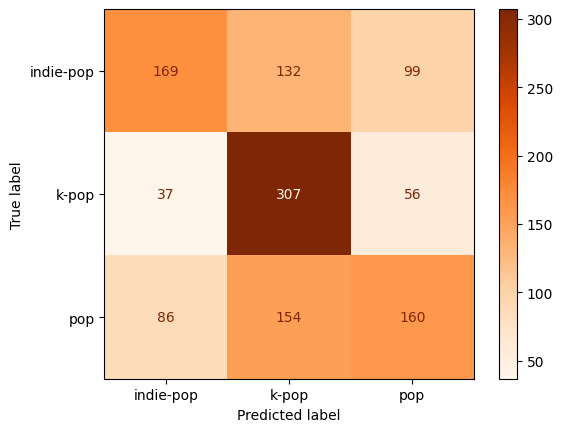

In [ ]:
f1s = []
bestf1 = 0

for i in range(100):
    combined_pca_nb = train_and_test_model(Simp_combined, 'track_genre', classifier, 0.40)
    score = (skm.f1_score(combined_pca_nb['true'], combined_pca_nb['predicted'], average= "macro"))
    f1s.append(round(score,2))
    if score > bestf1:
      bestf1 = score
      best = [combined_pca_nb['true'], combined_pca_nb['predicted']]
      best_clf = classifier


skm.ConfusionMatrixDisplay.from_predictions(best[0], best[1], cmap = 'Oranges')

print(skm.classification_report(best[0], best[1]))

print("Average F1-score")
print(np.mean(f1s))
print("Standard Deviation F1-score")
print(np.std(f1s))

## Decision Tree

In [ ]:
classifier = tree.DecisionTreeClassifier()

In [ ]:
f1s40 = []
f1s35 = []
f1s30 = []
f1s25 = []
f1s20 = []
for i in range(100):
    controle_nb40 = train_and_test_model(Simp_spf, 'track_genre', classifier, 0.4)
    controle_nb35 = train_and_test_model(Simp_spf, 'track_genre', classifier, 0.35)
    controle_nb30 = train_and_test_model(Simp_spf, 'track_genre', classifier, 0.3)
    controle_nb25 = train_and_test_model(Simp_spf, 'track_genre', classifier, 0.25)
    controle_nb20 = train_and_test_model(Simp_spf, 'track_genre', classifier, 0.20)
    f1s40.append(round(skm.f1_score(controle_nb40['true'], controle_nb40['predicted'], average= "macro"),2))
    f1s35.append(round(skm.f1_score(controle_nb35['true'], controle_nb35['predicted'], average= "macro"),2))
    f1s30.append(round(skm.f1_score(controle_nb30['true'], controle_nb30['predicted'], average= "macro"),2))
    f1s25.append(round(skm.f1_score(controle_nb25['true'], controle_nb25['predicted'], average= "macro"),2))
    f1s20.append(round(skm.f1_score(controle_nb20['true'], controle_nb20['predicted'], average= "macro"),2))

print('40%')
print(np.mean(f1s40))
print(np.std(f1s40))
print()

print('35%')
print(np.mean(f1s35))
print(np.std(f1s35))
print()

print('30%')
print(np.mean(f1s30))
print(np.std(f1s30))
print()

print('25%')
print(np.mean(f1s25))
print(np.std(f1s25))

print()
print('20%')
print(np.mean(f1s20))
print(np.std(f1s20))

In [ ]:
best_mean = 0
mean = 0.1
max_depth = 1
bestsf1 = []

while True:
    classifier = tree.DecisionTreeClassifier(max_depth= max_depth)

    f1s = []
    bestf1 = 0
    for i in range(100):
        tree_clf = train_and_test_model(Simp_spf, 'track_genre', classifier, 0.2)
        score = skm.f1_score(tree_clf['true'], tree_clf['predicted'], average= "macro")
        f1s.append(round(score,2))
        if score > bestf1:
            bestf1 = score
            best = [tree_clf['true'], tree_clf['predicted']]
            best_clf = classifier



    #skm.ConfusionMatrixDisplay.from_predictions(best[0], best[1], cmap = 'Oranges')

    #print(skm.classification_report(best[0], best[1]))

    mean = np.mean(f1s)
    bestsf1.append(mean)

    print("\n Tree com maxdeaph", max_depth)
    print("Average F1-score")
    print(mean)
    print("Standard Deviation F1-score")
    print(np.std(f1s))



    if best_mean < mean:
        best_mean = mean
    else:
        break

    max_depth+=1

In [ ]:
fig = px.line(x=range(1,len(bestsf1)+1), y=bestsf1, title='F1 score por profundidade maxima da árvore', width= 600)
fig.update_layout(
    xaxis_title="Profundidade máxima",
    yaxis_title="F1-Score médio",
    showlegend=False,
    font=dict(
        size=12,
        color="Black"
    )
)
fig.show()

In [ ]:
skm.ConfusionMatrixDisplay.from_predictions(best[0], best[1], cmap = 'Oranges')

print(skm.classification_report(best[0], best[1]))